# Pair Trading Experiment Lab

This notebook is my first step in learning quant trading. I've read several books and several articles from the internet to complete this notebook. 

Reference:

https://zerodha.com/varsity/chapter/pair-trading-basics/  
https://blog.quantinsti.com/kalman-filter-techniques-statistical-arbitrage-china-futures-market-python/


## Initialization

In [1]:
from ib_insync import *
import pandas as pd
import math
import numpy as np
import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt 
import requests
from bs4 import BeautifulSoup
import seaborn as sns
import datetime
from datetime import date


util.startLoop()
try:
    ib.disconnect()  # disconnect first if it's still connected
except:
    print()
ib = IB()
ib.connect('127.0.0.1', 7497, clientId=14)
ib.reqMarketDataType(3) # delayed market data 

Initialize Parameters

In [2]:
URL="https://en.wikipedia.org/wiki/Dow_Jones_Industrial_Average"

EXCHANGE= "SMART"
PRIMARY_EXCHANGE="NYSE"
DURATION="10 Y"
BAR_SIZE="1 DAY"
DATA_TYPE="ADJUSTED_LAST"

Scrape all the stocks from Dow Jones from Wiki

In [3]:
resp = requests.get(URL)

soup = BeautifulSoup(resp.content, 'html.parser')
table=soup.find_all("tbody")[1] # access the right table
#print(table.prettify())
equity_list= [i.get_text() for i in table.find_all(class_="external text") ]
print(equity_list)
print("count: "+ str(len(equity_list)))

['MMM', 'AXP', 'AMGN', 'AAPL', 'BA', 'CAT', 'CVX', 'CSCO', 'KO', 'DOW', 'GS', 'HD', 'HON', 'IBM', 'INTC', 'JNJ', 'JPM', 'MCD', 'MRK', 'MSFT', 'NKE', 'PG', 'CRM', 'TRV', 'UNH', 'VZ', 'V', 'WBA', 'WMT', 'DIS']
count: 30


In [4]:
## Assume the first stock return the correct value of rows, use it to check the size of others
contract = Stock(equity_list[0], EXCHANGE, 'USD')
bars = ib.reqHistoricalData(
    contract,
    endDateTime='',
    durationStr=DURATION,
    barSizeSetting=BAR_SIZE,
    whatToShow=DATA_TYPE,
    useRTH=True,
    formatDate=1)
size_check= len(bars)
print("Expected Size:" +str(size_check))

Expected Size:2516


In [5]:
df_raw=pd.DataFrame()
rejected_stock=[]

for stk in equity_list:
    contract = Stock(stk, EXCHANGE, 'USD',primaryExchange=PRIMARY_EXCHANGE)
    bars = ib.reqHistoricalData(
        contract,
        endDateTime='',
        durationStr=DURATION,
        barSizeSetting=BAR_SIZE,
        whatToShow=DATA_TYPE,
        useRTH=True,
        formatDate=1)
    df = util.df(bars)

    if len(df)!=size_check :  # check if the size of the return data is correct
        rejected_stock.append(stk)
        print(stk+ " rejected. size : " +str(len(df)))
        continue
    tempDF = df[["date","close"]].rename(columns={"close":stk})
    tempDF=tempDF.set_index("date")
    df_raw=pd.concat([df_raw, tempDF], axis=1)
#df_raw.to_csv("data.csv")
print("Completed")
print("Rejected Stock:")
print(rejected_stock)

DOW rejected. size : 554
WBA rejected. size : 1614
Completed
Rejected Stock:
['DOW', 'WBA']


In [6]:
df_raw.head()

,MMM,AXP,AMGN,AAPL,BA,CAT,CVX,CSCO,KO,GS,...,MSFT,NKE,PG,CRM,TRV,UNH,VZ,V,WMT,DIS
date,,,,,,,,,,,,,,,,,,,,,
2011-06-01,69.550,43.070,46.91,10.610,60.850,76.545,68.545,12.205,24.44,116.315,...,19.575,18.170,48.915,36.445,47.925,41.395,23.055,18.440,42.795,35.575
2011-06-02,69.565,43.225,46.56,10.630,61.125,77.260,67.625,12.110,24.16,114.785,...,19.410,18.015,48.630,37.060,47.910,42.285,22.990,18.790,42.205,35.275
2011-06-03,68.990,42.525,46.12,10.545,60.440,76.435,67.545,11.930,23.99,115.595,...,19.155,17.840,48.200,36.250,47.910,41.960,22.645,18.425,42.290,34.675
2011-06-06,68.925,42.095,46.05,10.380,60.230,75.500,66.665,11.915,23.95,114.375,...,19.240,17.710,48.250,35.710,47.815,41.360,22.380,18.210,42.370,34.695
2011-06-07,69.100,42.190,46.23,10.195,59.905,75.515,66.525,11.555,23.87,113.595,...,19.280,18.185,47.930,35.510,47.950,41.205,22.490,18.590,42.425,34.650


In [92]:
equity_list

['MMM',
 'AXP',
 'AMGN',
 'AAPL',
 'BA',
 'CAT',
 'CVX',
 'CSCO',
 'KO',
 'DOW',
 'GS',
 'HD',
 'HON',
 'IBM',
 'INTC',
 'JNJ',
 'JPM',
 'MCD',
 'MRK',
 'MSFT',
 'NKE',
 'PG',
 'CRM',
 'TRV',
 'UNH',
 'VZ',
 'V',
 'WBA',
 'WMT',
 'DIS']

## Data Cleaning and Splitting

In [7]:
df_raw[df_raw.isna().any(axis=1)]

,MMM,AXP,AMGN,AAPL,BA,CAT,CVX,CSCO,KO,GS,...,MSFT,NKE,PG,CRM,TRV,UNH,VZ,V,WMT,DIS
date,,,,,,,,,,,,,,,,,,,,,


In [8]:
# train and test splitting
data_size= len(df_raw)
TRAIN_SIZE=80
# split into 80/20 , temp and test_df
temp_df=df_raw.head(int(data_size*(TRAIN_SIZE/100)))
test_df=df_raw.tail(int(data_size*((100-TRAIN_SIZE)/100)))

# then split the 80% into 80/20 for train/val
data_size=len(temp_df)
train_df=temp_df.head(int(data_size*(TRAIN_SIZE/100)))
val_df=temp_df.tail(int(data_size*((100-TRAIN_SIZE)/100)))
print("train_df size:"+str(len(train_df)))
print("val_df size:"+str(len(val_df)))
print("test_df size:"+str(len(test_df)))

train_df size:1609
val_df size:402
test_df size:503


# Pair forming

Since we're using the stocks from the same sector, we can form pairs from the pool of stocks. 

Things to try ( in pair forming):
<br>
1. clustering
<br>
2. pca

### Filter Pairs

Two-step Engle-Granger cointegration test will be used to filter out potential pairs that are cointegrated. Alternative way will be using Johansen test.


The two-step Engle-Granger cointegration test proceeds as follows:
<br>
1. Test if a unit root is present in the series yt and xt using ADF test. If affirmative, proceed to step 2.
<br>
2. Run regression defined in (2.7), using Ordinary Least Squares, and save the residuals, uˆt.
<br>
3. Test the residuals uˆt for a unit root, using ADF test (or similar).
<br>
4. If the null hypothesis of a unit root in the residuals (null of no-cointegration) is rejected, meaning the residual series is stationary, the two variables are cointegrated.


In [9]:
#cadf
def find_cointegrated_pairs(data,critical_level=0.05):
    n = data.shape[1]
    score_matrix = np.zeros((n, n))
    pvalue_matrix = np.ones((n, n))
    keys = data.keys()
    pairs = []
    for i in range(n):
        for j in range(i+1,n): # since A/B != B/A , we must check every single pair 
            # if i ==j:      
            #     continue 
            swap=False
            S1 = data[keys[i]]
            S2 = data[keys[j]]
            result1 = coint(S1, S2,return_results=False) # S1 is Y, S2 is X 
            result2 = coint(S2, S1,return_results=False)
            if(result1[0]>result2[0]): # choose the one with lower t stat.
                result=result2
                swap=True
            else: 
                result=result1

            score = result[0]
            pvalue = result[1]
            score_matrix[i, j] = score
            pvalue_matrix[i, j] = pvalue

            if pvalue < critical_level:  # 95 % confidence that pairs cointegrate
                if(swap):
                    pairs.append(keys[i]+"/"+ keys[j]) 
                else:
                    pairs.append(keys[j]+"/"+ keys[i])
    return score_matrix, pvalue_matrix, pairs
score_matrix,pvalue_matrix,filtered_pairs =find_cointegrated_pairs(train_df)
len(filtered_pairs)
filtered_pairs

['MMM/CSCO',
 'MMM/KO',
 'MMM/HON',
 'MMM/JNJ',
 'MMM/CRM',
 'MMM/V',
 'CSCO/AMGN',
 'AMGN/KO',
 'CRM/AMGN',
 'TRV/AMGN',
 'CSCO/KO',
 'HD/CSCO',
 'HON/CSCO',
 'JNJ/CSCO',
 'CSCO/MRK',
 'CSCO/PG',
 'CRM/CSCO',
 'TRV/CSCO',
 'UNH/CSCO',
 'V/CSCO',
 'HD/KO',
 'HON/KO',
 'JNJ/KO',
 'CRM/KO',
 'TRV/KO',
 'KO/VZ',
 'V/KO',
 'CRM/HD',
 'HD/TRV',
 'V/HD',
 'JNJ/HON',
 'HON/PG',
 'HON/CRM',
 'HON/V',
 'NKE/IBM',
 'PG/MRK',
 'MRK/VZ',
 'UNH/MSFT',
 'TRV/CRM',
 'V/CRM',
 'V/TRV']

### Plot the scatterplot of the filtered pairs

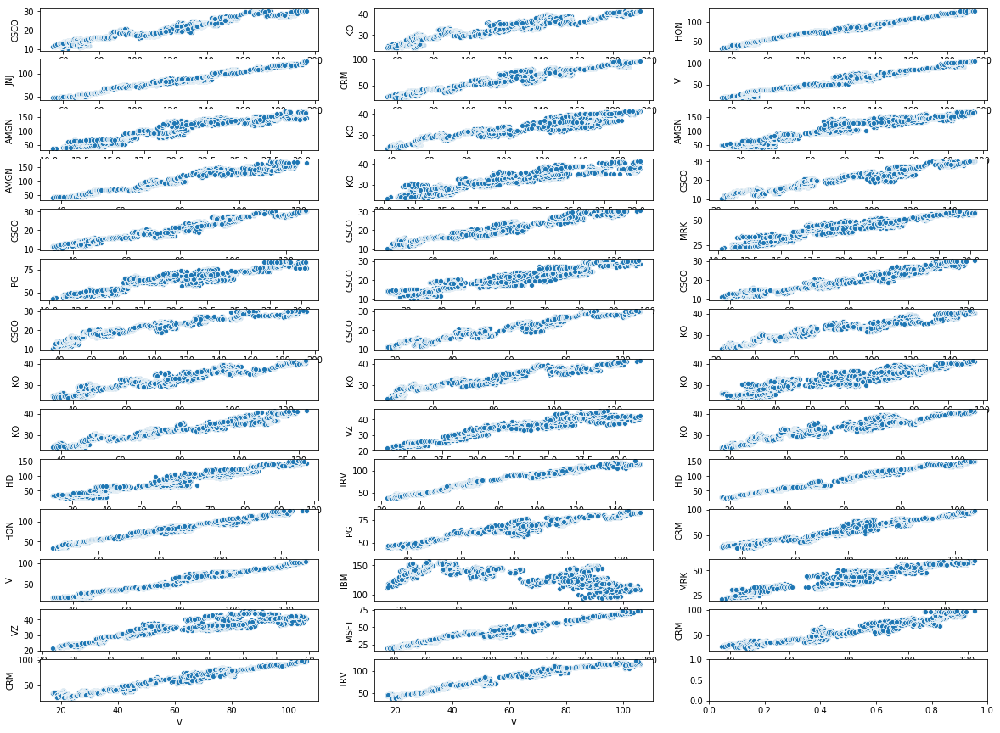

In [10]:
fig, axes = plt.subplots(int(len(filtered_pairs)/3)+1,3,figsize=(20,15))
def plot_scatterplot(df):
    row=0
    column=0
    for i in filtered_pairs:
        x,y=i.split("/")
        sns.scatterplot(ax=axes[row,column],x=x,y=y,data=df)
        column+=1
        if(column==3):
            row+=1
            column=0
plot_scatterplot(train_df)

### 

In [11]:
train_params={}
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
def static_linear_reg(pairs_list,df):
    df_result=pd.DataFrame()
    res_result={}
    for i in pairs_list:
        x,y=i.split("/")
        x=sm.add_constant(df[x].values, prepend=False)
        model = sm.OLS(df[y],x)
        result = model.fit()
        df_result[i+" residual"]=result.resid
        res_result[i+" coef"]=result.params["x1"]
        # res_result[i+" intercept SE"]=result.bse["const"] # standard error of intercept
        # res_result[i+" residual SE"]=np.std(result.resid) # residual standard error
        # res_result[i+" error ratio"]=res_result[i+" intercept SE"]/res_result[i+" residual SE"]
    return df_result,res_result
train_resid,train_coef=static_linear_reg(filtered_pairs,train_df)
train_params.update(train_coef)
train_resid


,MMM/CSCO residual,MMM/KO residual,MMM/HON residual,MMM/JNJ residual,MMM/CRM residual,MMM/V residual,CSCO/AMGN residual,AMGN/KO residual,CRM/AMGN residual,TRV/AMGN residual,...,HON/PG residual,HON/CRM residual,HON/V residual,NKE/IBM residual,PG/MRK residual,MRK/VZ residual,UNH/MSFT residual,TRV/CRM residual,V/CRM residual,V/TRV residual
date,,,,,,,,,,,,,,,,,,,,,
2011-06-01,-1.800375,-3.189438,-2.871104,-3.750038,0.379637,-9.790897,-5.839153,-1.708823,-18.317431,-8.254044,...,-1.972369,2.545469,-7.137555,-24.334994,-2.514343,-3.295474,-3.006718,3.744354,8.241949,4.074137
2011-06-02,-1.897447,-3.471111,-2.555761,-3.758684,0.987218,-9.449950,-5.567634,-1.949782,-19.790734,-8.580379,...,-2.393068,2.911194,-7.091827,-24.751611,-2.328990,-3.322170,-3.467520,4.371477,8.571640,3.720225
2011-06-03,-1.998035,-3.576985,-2.725574,-3.702276,0.461614,-9.467930,-4.830020,-2.070703,-18.751261,-9.020379,...,-2.597599,2.515374,-6.951266,-25.583758,-2.171178,-3.547150,-3.614502,3.561477,8.059177,4.073662
2011-06-06,-2.004059,-3.609736,-2.528727,-3.709813,-0.046237,-9.643702,-4.801886,-2.102895,-17.834946,-8.940495,...,-2.612317,1.856489,-7.311381,-25.862210,-2.401854,-3.717666,-3.330085,3.098260,7.694439,4.186851
2011-06-07,-2.388227,-3.709253,-3.101392,-4.220676,-0.332792,-9.369316,-2.266658,-2.202973,-17.289645,-8.973487,...,-2.740251,2.009308,-6.500718,-26.367096,-2.104528,-3.610220,-3.238569,2.789148,7.184674,3.953889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-10-13,-1.083018,-0.334436,0.075920,-1.839245,-0.572184,2.881689,-5.322769,1.899182,-11.352100,1.053343,...,-1.883567,-0.566766,2.871371,-3.044959,-3.137121,-1.113838,4.082069,8.834860,-2.712721,-12.249093
2017-10-16,-1.145933,-0.038691,-0.157066,-2.632206,-0.802380,1.989562,-6.710307,2.405169,-12.730667,-3.057652,...,-1.935529,-0.617545,2.198055,-3.072501,-3.264337,-0.895855,4.017696,7.448597,-2.213336,-9.930340
2017-10-17,-0.972161,-0.032782,0.111606,2.083464,-0.807023,1.768583,-3.215134,1.885166,-8.090268,1.041895,...,-2.121532,-0.828951,1.724878,-2.998935,-3.090714,-0.572230,0.595872,7.143873,-2.040110,-9.368783


### Hurst Exponent to double check if the pairs are mean reverting

In [12]:
def hurst(ts):
    """Returns the Hurst Exponent of the time series vector ts"""
    # Create the range of lag values
    lags = range(2, 100)
    # Calculate the array of the variances of the lagged differences
    tau = [np.sqrt(np.std(np.subtract(ts[lag:], ts[:-lag]))) for lag in lags]
 
    # Use a linear fit to estimate the Hurst Exponent
    poly = np.polyfit(np.log(lags), np.log(tau), 1)
 
    # Return the Hurst exponent from the polyfit output
    return poly[0]*2.0

#--------------------------------------------------------------------------------------

res=hurst(train_resid)
assert len(res[res>=0.5])==0 , "One of the pair is not time reversal"
print("All of the pairs are mean reverting")
res

All of the pairs are mean reverting


array([0.43444669, 0.38180995, 0.34904805, 0.39711916, 0.39261142,
       0.40935694, 0.40385975, 0.38269814, 0.38426051, 0.3721242 ,
       0.46977978, 0.40916785, 0.42374654, 0.41994969, 0.37657998,
       0.4046145 , 0.4892655 , 0.4169652 , 0.40205219, 0.43683948,
       0.37690042, 0.40047932, 0.34544843, 0.42504136, 0.37671984,
       0.38503492, 0.40846504, 0.38324118, 0.32752231, 0.33973585,
       0.3681933 , 0.42425963, 0.38398135, 0.40195633, 0.4147337 ,
       0.40015423, 0.40188552, 0.43523585, 0.40144235, 0.38916935,
       0.37464526])

### Plot the graph of the residual of the pairs

C:\Users\kenny\Anaconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


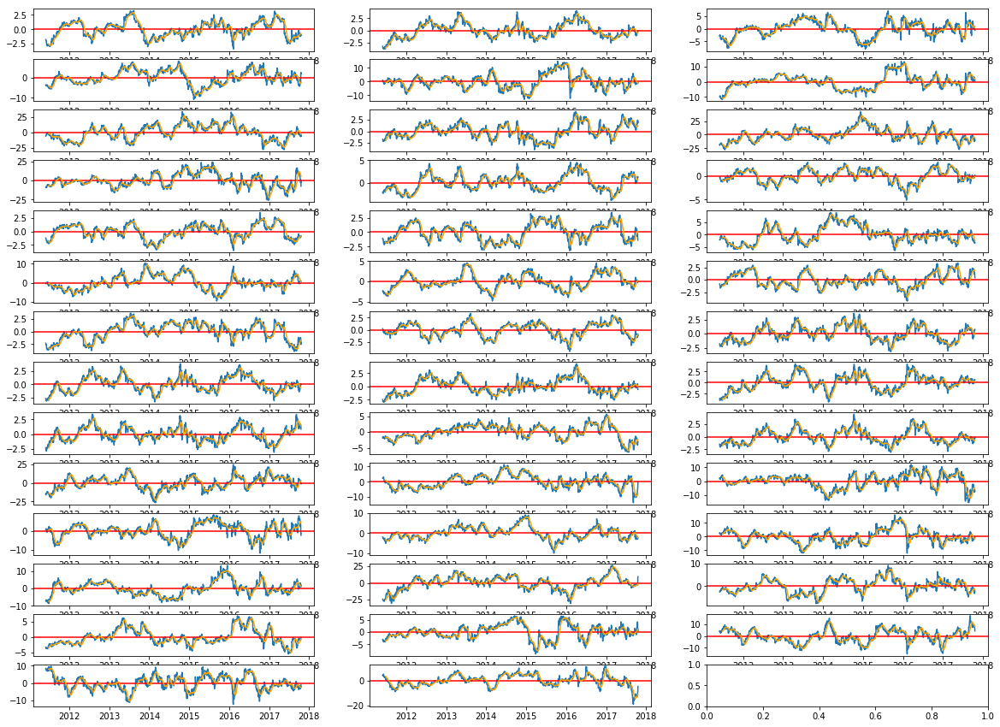

In [13]:
fig, axes = plt.subplots(int(len(filtered_pairs)/3)+1,3,figsize=(20,15))
def plot_lineplot(df,lookback):
    row=0
    column=0
    for i in range(len(df.columns)):
        sns.lineplot(ax=axes[row,column],data=df.iloc[:,i])
        axes[row,column].axhline(y=np.mean(df.iloc[:,i]), color='r', linestyle='-')
        rolling_mean = df.iloc[:,i].rolling(window=lookback).mean()
        axes[row,column].plot(rolling_mean, color='orange')
        column+=1
        if(column==3):
            row+=1
            column=0
plot_lineplot(train_resid,20)

### Calculating the Half Life of the pair

In [14]:

def half_life(spread):
    spread_lag = spread.shift(1)
    spread_lag.iloc[0] = spread_lag.iloc[1] # some uses 0
    
    spread_ret = spread - spread_lag
    spread_ret.iloc[0] = spread_ret.iloc[1] # some uses 0
    
    spread_lag2 = sm.add_constant(spread_lag)
     
    model = sm.OLS(spread_ret,spread_lag2)
    res = model.fit()
    # if cooef is positive, means that it will not mean reverting at all, if close to 0, means half life very long.
    halflife = round(-np.log(2) / res.params[1],0)
 
    #halflife[halflife<0]=1
    return halflife

half_life(train_df)
for i in range(len(filtered_pairs)):
    train_params[filtered_pairs[i]+ " half life"]=(half_life(train_resid.iloc[:,i]))



C:\Users\kenny\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


In [15]:
train_params

{'MMM/CSCO coef': 0.13810635657559836,
 'MMM/KO coef': 0.11152250452872994,
 'MMM/HON coef': 0.6438038875564116,
 'MMM/JNJ coef': 0.5763609838733976,
 'MMM/CRM coef': 0.4946015323121068,
 'MMM/V coef': 0.6035128121285205,
 'CSCO/AMGN coef': 6.542300220874136,
 'AMGN/KO coef': 0.11154431236159618,
 'CRM/AMGN coef': 1.8265091176372787,
 'TRV/AMGN coef': 1.5777186406768229,
 'CSCO/KO coef': 0.7576398370970638,
 'HD/CSCO coef': 0.14564858725232166,
 'HON/CSCO coef': 0.2132680746632593,
 'JNJ/CSCO coef': 0.234492436223117,
 'CSCO/MRK coef': 1.7960937398393177,
 'CSCO/PG coef': 1.858835915351646,
 'CRM/CSCO coef': 0.2604058354084374,
 'TRV/CSCO coef': 0.22612281149683683,
 'UNH/CSCO coef': 0.11872605784004701,
 'V/CSCO coef': 0.22365782738334672,
 'HD/KO coef': 0.11919102658063409,
 'HON/KO coef': 0.17281150173966925,
 'JNJ/KO coef': 0.19315213440403814,
 'CRM/KO coef': 0.21160334829337735,
 'TRV/KO coef': 0.18707778755917115,
 'KO/VZ coef': 1.2024718251250741,
 'V/KO coef': 0.18232894424437

# Back Test Trading strategy

In [213]:
 # A class that check whether the pair is stationary/mean reverting 
class Pair:
    def __init__(self, symbol_a, symbol_b, ts_a, ts_b):
        self.symbol_a = symbol_a
        self.symbol_b = symbol_b
        self.ts_a = ts_a
        self.ts_b = ts_b
        self.coef=None
        self.spread=None # resid
        self.half_life=None
        
    def cointegration_test(self):
        if not self.CADF():
            return False
        self.static_linear_reg() #calculate spread and coef
        if self.hurst()>=0.5 or not self.calculate_half_life(): # check hurst<
            return False
        return True
        
    def distance(self):
        # calculate the sum of squared deviations between two normalized price series
        norm_a = np.array(self.ts_a)/self.ts_a[0]
        norm_b = np.array(self.ts_b)/self.ts_b[0]
        return sum((norm_a - norm_b)**2)
        
    def static_linear_reg(self):
        x=sm.add_constant(self.ts_a.values, prepend=False)
        model = sm.OLS(self.ts_b,x)
        result = model.fit()
        self.spread=result.resid
        self.coef=result.params["x1"]

    def hurst(self):
        """Returns the Hurst Exponent of the time series vector ts"""
        # Create the range of lag values
        lags = range(2, 100)
        # Calculate the array of the variances of the lagged differences
        tau = [np.sqrt(np.std(np.subtract(self.spread[lag:].to_list(), self.spread[:-lag].to_list()))) for lag in lags]
     
        # Use a linear fit to estimate the Hurst Exponent
        poly = np.polyfit(np.log(lags), np.log(tau), 1)
     
        # Return the Hurst exponent from the polyfit output
        return poly[0]*2.0
    
    def calculate_half_life(self):
        spread_lag = self.spread.shift(1)
        spread_lag.iloc[0] = spread_lag.iloc[1] # some uses 0
        
        spread_ret = self.spread - spread_lag
        spread_ret.iloc[0] = spread_ret.iloc[1] # some uses 0
        
        spread_lag2 = sm.add_constant(spread_lag,prepend=False)
         
        model = sm.OLS(spread_ret,spread_lag2)
        res = model.fit()
        # if cooef is positive, means that it will not mean reverting at all, if close to 0, means half life very long.
        if(res.params[0]>0):
            print("Non Mean Reverting")
            return False
        self.half_life = round(-np.log(2) / res.params[0],0)
        return True

    def CADF(self,critical_level=0.05):

        swap=False
        result1 = coint(self.ts_b, self.ts_a,return_results=False) # ts_a is X, ts_b is Y
        result2 = coint(self.ts_a, self.ts_b,return_results=False) 

        if(result1[0]>result2[0]): # choose the one with lower t stat.
            result=result2
            swap=True
        else: 
            result=result1
        score = result[0]
        pvalue = result[1]

        if pvalue < critical_level:  # 95 % confidence that pairs cointegrate
            if(swap):
                self.symbol_a,self.symbol_b=self.symbol_b,self.symbol_a
                self.ts_a,self.ts_b= self.ts_b,self.ts_a
            return True
        return False
temp=[]
for i in raw_list:
    x,y=i[0],i[1]
    pair=Pair(x,y,df_raw[x],df_raw[y])
    if pair.cointegration_test():
        temp.append(pair)

        

C:\Users\kenny\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


## Linear Mean-Reverting Trading Strategy

DISCLAIMER : Do not recommend building your own backtesting algo unless you know what you're doing. Currently using QuantConnect platform to perform backtesting.

In [259]:
# reference https://pythonforfinance.net/2016/07/08/python-backtesting-mean-reversion-part-3/

#EXPLANATION_1
# Let’s say for argument you have calculated a hedge ratio of -1, so for every unit of x that you buy, you sell 1 unit of y. Let’s then say that the price of x = $10, and the price of y = $15 at some point in time, T, so that the spread is $5.
# If when moving to time T+1, the price of x remains at 10, and the price of y falls to $14, so you have gained $1 on the sale of y, if the denominator of the “spread pct change” was the initial spread at time T, then it would represent a (5 – 4) / 5 = 20% change and a 20% “profit”. But you havn’t really made 20% just because the spread changed by $1.
# I think a better denominator to use is the gross value of the portfolio; that is the $10 + $15 which would represent a (5 – 4) / (10 + 15) = 4% return.
# It’s always difficult to conceptualise percentage returns for long/short portfolios as you actually receive funds from the short sale of assets, which can theoretically cause your initial “Investment” to be zero…which we all know results in a nonsensical return of infinity.

    # #logic 
    # long entry   num units long
    # 1               1
    # 0             nan
    # 0              nan
    
    # # front filling
    # long entry  exit    num units long
    # 1             0        1
    # 0             0        1
    # 0             1        0



# using the hedge ratio and half life from linear regression to backtest but using the coeef calculated during the training. woudn't expect it ot do well
def StaticHedgeRatioBackTesting(pair_symbol,param,ts):
    pair1,pair2=pair_symbol.split("/")
    half_life=int(param[pair_symbol+" half life"])
    coef=param[pair_symbol+" coef"]
    
    #calculate the spread by the coef that we got
    df=pd.DataFrame()
    df["spread"]= ts[pair2][half_life:]-coef*ts[pair1][half_life:]

    #calculate the moving average and moving std from past half life days
    SMA = df.spread.rolling(window=half_life).mean().dropna()
    MovingStd = df.spread.rolling(window=half_life).std().dropna()
    #calculate the zScore
    df['zScore'] = (df.spread-SMA)/MovingStd
    #     plt.figure(figsize=(10,5))
    # df['zScore'].plot()
    # plt.axhline(y=2,color="red")
    # plt.axhline(y=-2,color="red")
    # plt.title("zScore")
    #plt.show()

    ##############################################################

    entryZscore = 2
    exitZscore = 0


    #set up num units long             
    df['long entry'] = ((df.zScore < - entryZscore) & ( df.zScore.shift(1) > - entryZscore)) # long when the zscore pass through the entryZscore
    df['long exit'] = ((df.zScore > - exitZscore) & (df.zScore.shift(1) < - exitZscore))     # close long when zscore pass 0
    df['num units long'] = np.nan   
    df.loc[df['long entry'],'num units long'] = 1  
    df.loc[df['long exit'],'num units long'] = 0
    if(df['num units long'][0]!=1):   # if there's no long trade on first day
        df.loc[:1,'num units long'] = 0 
    df['num units long'] = df['num units long'].fillna(method='pad') #frontfill
    
    # Set up num units short 
    df['short entry'] = ((df.zScore >  entryZscore) & ( df.zScore.shift(1) < entryZscore))
    df['short exit'] = ((df.zScore < exitZscore) & (df.zScore.shift(1) > exitZscore))
    df.loc[df['short entry'],'num units short'] = -1
    df.loc[df['short exit'],'num units short'] = 0
    if(df['num units short'][0]!=-1):   # if there's no short trade on first day
        df.loc[:1,'num units short'] = 0 
    
    df['num units short'] = df['num units short'].fillna(method='pad')

    #calculate whether to short/long neutral on that day
    df['numUnits'] = df['num units long'] + df['num units short']
    # spread percentage change
    df['spread pct ch'] = (df['spread'] - df['spread'].shift(1)) / ((abs(coef)*ts[pair1][half_life:]) + ts[pair2][half_life:])  #spread diff between 2 day / (y_predicted + y) EXPLAINATION_1
    # df['port rets'] = df['spread pct ch'] * df['numUnits'].shift(1)

    # df['cum rets'] = df['port rets'].cumsum()
    # df['cum rets'] = df['cum rets'] + 1
    df['port rets'] = df['spread pct ch'] * df['numUnits'].shift(1)
    df['port rets + 1'] = df['port rets'] + 1
    df['cum rets'] = df['port rets + 1'].cumprod()
    ##############################################################

    try:
        sharpe = ((df['port rets'].mean() / df['port rets'].std()) * math.sqrt(252)) 
    except ZeroDivisionError:
        sharpe = 0.0
    
    # plt.title("cummulative return")
    # plt.plot(df['cum rets'])
    # plt.xlabel(pair1)
    # plt.ylabel(pair2)
    #plt.show()

    ##############################################################

    start_val = 1
    end_val = df['cum rets'].iat[-1]
        
    start_date = df.iloc[0].name
    end_date = df.iloc[-1].name
    days = (end_date - start_date).days
   #Compound annual growth rate 
    CAGR = round(((float(end_val) / float(start_val)) ** (252.0/days)) - 1,4)


    # print("CAGR: {} %".format(CAGR*100))
    # print("Sharpe Ratio = {}".format(round(sharpe,2)))
    return CAGR,round(sharpe,2)
# concat the last train to val to make sure that we can get the mean and standard dev on 1st day
for i in filtered_pairs:
    half_life=int(train_params[i+" half life"])-1
    ts=pd.concat([train_df[-half_life:],val_df])
    CAGR,sharpe=StaticHedgeRatioBackTesting(i,train_params,ts)
    if(CAGR*100>2):    
        print(i)    
        print("CAGR: {} %".format(CAGR*100))
        print("Sharpe Ratio = {}".format(round(sharpe,2)))
        print()

AMGN/KO
CAGR: 2.83 %
Sharpe Ratio = 0.52

HD/CSCO
CAGR: 3.39 %
Sharpe Ratio = 0.57

TRV/CSCO
CAGR: 7.28 %
Sharpe Ratio = 1.27

V/CSCO
CAGR: 2.11 %
Sharpe Ratio = 0.46

JNJ/KO
CAGR: 3.7600000000000002 %
Sharpe Ratio = 0.77

KO/VZ
CAGR: 7.16 %
Sharpe Ratio = 1.83

CRM/HD
CAGR: 3.75 %
Sharpe Ratio = 0.64

HON/V
CAGR: 2.06 %
Sharpe Ratio = 0.48

MRK/VZ
CAGR: 5.11 %
Sharpe Ratio = 1.19

V/TRV
CAGR: 3.71 %
Sharpe Ratio = 0.78



In [88]:
# reference https://pythonforfinance.net/2016/07/08/python-backtesting-mean-reversion-part-3/

#EXPLANATION_1
# Let’s say for argument you have calculated a hedge ratio of -1, so for every unit of x that you buy, you sell 1 unit of y. Let’s then say that the price of x = $10, and the price of y = $15 at some point in time, T, so that the spread is $5.
# If when moving to time T+1, the price of x remains at 10, and the price of y falls to $14, so you have gained $1 on the sale of y, if the denominator of the “spread pct change” was the initial spread at time T, then it would represent a (5 – 4) / 5 = 20% change and a 20% “profit”. But you havn’t really made 20% just because the spread changed by $1.
# I think a better denominator to use is the gross value of the portfolio; that is the $10 + $15 which would represent a (5 – 4) / (10 + 15) = 4% return.
# It’s always difficult to conceptualise percentage returns for long/short portfolios as you actually receive funds from the short sale of assets, which can theoretically cause your initial “Investment” to be zero…which we all know results in a nonsensical return of infinity.

    # #logic 
    # long entry   num units long
    # 1               1
    # 0             nan
    # 0              nan
    
    # # front filling
    # long entry  exit    num units long
    # 1             0        1
    # 0             0        1
    # 0             1        0

from statsmodels.regression.rolling import RollingOLS


# using the hedge ratio and half life from linear regression to backtest
def RollingHedgeRatioBackTesting(pair_symbol,param,ts):
    pair1,pair2=pair_symbol.split("/")
    half_life=int(param[pair_symbol+" half life"])
    
    exog =sm.add_constant(ts[pair1].values, prepend=False)
    mod = RollingOLS(ts[pair2], exog,window=half_life)
    rolling_res = mod.fit()
    coef=rolling_res.params["x1"][half_life:]

    #calculate the spread by the coef that we got
    df=pd.DataFrame()
    df["spread"]= ts[pair2][half_life:]-coef*ts[pair1][half_life:]

    #calculate the moving average and moving std from past half life days
    SMA = df.spread.rolling(window=half_life).mean().dropna()
    MovingStd = df.spread.rolling(window=half_life).std().dropna()
    #calculate the zScore
    df['zScore'] = (df.spread-SMA)/MovingStd
    #     plt.figure(figsize=(10,5))
    # df['zScore'].plot()
    # plt.axhline(y=2,color="red")
    # plt.axhline(y=-2,color="red")
    # plt.title("zScore")
    #plt.show()

    ##############################################################

    entryZscore = 2
    exitZscore = 0


    #set up num units long             
    df['long entry'] = ((df.zScore < - entryZscore) & ( df.zScore.shift(1) > - entryZscore)) # long when the zscore pass through the entryZscore
    df['long exit'] = ((df.zScore > - exitZscore) & (df.zScore.shift(1) < - exitZscore))     # close long when zscore pass 0
    df['num units long'] = np.nan   
    df.loc[df['long entry'],'num units long'] = 1  
    df.loc[df['long exit'],'num units long'] = 0
    if(df['num units long'][0]!=1):   # if there's no long trade on first day
        df.loc[:1,'num units long'] = 0 
    df['num units long'] = df['num units long'].fillna(method='pad') #frontfill
    
    # Set up num units short 
    df['short entry'] = ((df.zScore >  entryZscore) & ( df.zScore.shift(1) < entryZscore))
    df['short exit'] = ((df.zScore < exitZscore) & (df.zScore.shift(1) > exitZscore))
    df.loc[df['short entry'],'num units short'] = -1
    df.loc[df['short exit'],'num units short'] = 0
    if(df['num units short'][0]!=-1):   # if there's no short trade on first day
        df.loc[:1,'num units short'] = 0 
    
    df['num units short'] = df['num units short'].fillna(method='pad')

    #calculate whether to short/long neutral on that day
    df['numUnits'] = df['num units long'] + df['num units short']
    # spread percentage change
    df['spread pct ch'] = (df['spread'] - df['spread'].shift(1)) / ((abs(coef)*ts[pair1][half_life:]) + ts[pair2][half_life:])  #spread diff between 2 day / (y_predicted + y) EXPLAINATION_1
    # df['port rets'] = df['spread pct ch'] * df['numUnits'].shift(1)

    # df['cum rets'] = df['port rets'].cumsum()
    # df['cum rets'] = df['cum rets'] + 1
    df['port rets'] = df['spread pct ch'] * df['numUnits'].shift(1)
    df['port rets + 1'] = df['port rets'] + 1
    df['cum rets'] = df['port rets + 1'].cumprod()
    ##############################################################

    try:
        sharpe = ((df['port rets'].mean() / df['port rets'].std()) * math.sqrt(252)) 
    except ZeroDivisionError:
        sharpe = 0.0
    
    # plt.title("cummulative return")
    # plt.plot(df['cum rets'])
    # plt.xlabel(pair1)
    # plt.ylabel(pair2)
    #plt.show()

    ##############################################################

    start_val = 1
    end_val = df['cum rets'].iat[-1]
        
    start_date = df.iloc[0].name
    end_date = df.iloc[-1].name
    days = (end_date - start_date).days
   #Compound annual growth rate 
    CAGR = round(((float(end_val) / float(start_val)) ** (252.0/days)) - 1,4)


    # print("CAGR: {} %".format(CAGR*100))
    # print("Sharpe Ratio = {}".format(round(sharpe,2)))
    return CAGR,round(sharpe,2)
# concat the last train to val to make sure that we can get the mean and standard dev on 1st day
for i in filtered_pairs:
    half_life=int(train_params[i+" half life"])-1
    ts=pd.concat([train_df[-half_life:],val_df,test_df])
    CAGR,sharpe=RollingHedgeRatioBackTesting(i,train_params,ts)
    if(CAGR*100>2):    
        print(i)    
        print("CAGR: {} %".format(CAGR*100))
        print("Sharpe Ratio = {}".format(round(sharpe,2)))
        print()

AMGN/KO
CAGR: 4.71 %
Sharpe Ratio = 0.37

CRM/AMGN
CAGR: 25.629999999999995 %
Sharpe Ratio = 0.9

TRV/AMGN
CAGR: 3.1300000000000003 %
Sharpe Ratio = 0.4

JNJ/CSCO
CAGR: 29.509999999999998 %
Sharpe Ratio = 0.9

CRM/CSCO
CAGR: 15.870000000000001 %
Sharpe Ratio = 0.7

TRV/CSCO
CAGR: 15.160000000000002 %
Sharpe Ratio = 0.64

CRM/HD
CAGR: 32.269999999999996 %
Sharpe Ratio = 0.9

V/HD
CAGR: 14.21 %
Sharpe Ratio = 0.62

HON/CRM
CAGR: 14.29 %
Sharpe Ratio = 0.63

MRK/VZ
CAGR: 10.89 %
Sharpe Ratio = 0.87

V/CRM
CAGR: 43.81 %
Sharpe Ratio = 0.99



## Ignore this section

The code is credited to [drtomstarke](https://web.archive.org/web/20140612041028/http://drtomstarke.com/index.php/variance-ratio-test/).

In [ ]:
from numpy import *
from numpy import random

def normcdf(X):
    (a1,a2,a3,a4,a5) = (0.31938153, -0.356563782, 1.781477937, -1.821255978, 1.330274429)
    L = abs(X)
    K = 1.0 / (1.0 + 0.2316419 * L)
    w = 1.0 - 1.0 / sqrt(2*pi)*exp(-L*L/2.) * (a1*K + a2*K*K + a3*pow(K,3) + a4*pow(K,4) + a5*pow(K,5))
    if X<0:
        w = 1.0-w
    return w


def vratio(a, lag = 2, cor = 'hom'):
	t = (std((a[lag:]) - (a[1:-lag+1])))**2;
	b = (std((a[2:]) - (a[1:-1]) ))**2;

	n = float(len(a))
	mu  = sum(a[1:n]-a[:-1])/n;
	m=(n-lag+1)*(1-lag/n);
#	print mu, m, lag
	b=sum(square(a[1:n]-a[:n-1]-mu))/(n-1)
	t=sum(square(a[lag:n]-a[:n-lag]-lag*mu))/m
	vratio = t/(lag*b);

	la = float(lag)
	

	if cor == 'hom':
		varvrt=2*(2*la-1)*(la-1)/(3*la*n)


	elif cor == 'het':
	      varvrt=0;
	      sum2=sum(square(a[1:n]-a[:n-1]-mu)); 
	      for j in range(lag-1):
	         sum1a=square(a[j+1:n]-a[j:n-1]-mu); 
	         sum1b=square(a[1:n-j]-a[0:n-j-1]-mu)
	         sum1=dot(sum1a,sum1b); 
	         delta=sum1/(sum2**2);
	         varvrt=varvrt+((2*(la-j)/la)**2)*delta

	zscore = (vratio - 1) / sqrt(float(varvrt))
	pval = normcdf(zscore);

	return  vratio, zscore, pval


vratio(np.log(usd_cad.values), cor='het', lag=20)

In [ ]:
def KalmanFilterAverage(x):
    # Construct a Kalman filter
    from pykalman import KalmanFilter
    kf = KalmanFilter(transition_matrices = [1],
                      observation_matrices = [1],
                      initial_state_mean = 0,
                      initial_state_covariance = 1,
                      observation_covariance=1,
                      transition_covariance=.01)

    # Use the observed values of the price to get a rolling mean
    state_means, _ = kf.filter(x.values)
    state_means = pd.Series(state_means.flatten(), index=x.index)
    return state_means

#  Kalman filter regression
def KalmanFilterRegression(x,y):

    delta = 1e-3
    trans_cov = delta / (1 - delta) * np.eye(2) # How much random walk wiggles
    obs_mat = np.expand_dims(np.vstack([[x], [np.ones(len(x))]]).T, axis=1)
    
    kf = KalmanFilter(n_dim_obs=1, n_dim_state=2, # y is 1-dimensional, (alpha, beta) is 2-dimensional
                      initial_state_mean=[0,0],
                      initial_state_covariance=np.ones((2, 2)),
                      transition_matrices=np.eye(2),
                      observation_matrices=obs_mat,
                      observation_covariance=2,
                      transition_covariance=trans_cov)
    
    # Use the observations y to get running estimates and errors for the state parameters
    state_means, state_covs = kf.filter(y.values)
    return state_means    

In [554]:
#diff=df_raw.diff().rename(columns=lambda s : s+"_closing_diff")
diff=df_raw.diff().fillna(0)
diff

,AAPL,GOOGL,EBAY,MSFT,ADBE,INTC,AMZN
date,,,,,,,
2018-05-29 21:30:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2018-05-30 00:00:00,0.15,-2.93,-0.04,0.45,0.84,0.32,1.86
2018-05-30 21:30:00,-0.18,9.23,0.46,0.76,6.14,0.48,11.42
2018-05-31 00:00:00,0.09,-0.47,-0.16,0.10,-0.85,-0.15,1.57
2018-05-31 21:30:00,0.09,28.54,-0.32,0.84,3.21,0.00,6.63
...,...,...,...,...,...,...,...
2021-05-20 21:30:00,2.36,33.22,0.26,4.21,13.32,0.66,15.61
2021-05-21 00:00:00,0.26,1.55,-0.59,-0.87,-1.81,-0.08,0.98
2021-05-21 21:30:00,-1.55,-4.07,1.33,-0.99,-3.52,0.18,-44.74


In [555]:
df=pd.concat([df_raw,diff],axis=1)
df

,AAPL,GOOGL,EBAY,MSFT,ADBE,INTC,AMZN,AAPL,GOOGL,EBAY,MSFT,ADBE,INTC,AMZN
date,,,,,,,,,,,,,,
2018-05-29 21:30:00,45.26,1071.00,36.38,93.91,241.28,51.07,1611.02,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2018-05-30 00:00:00,45.41,1068.07,36.34,94.36,242.12,51.39,1612.88,0.15,-2.93,-0.04,0.45,0.84,0.32,1.86
2018-05-30 21:30:00,45.23,1077.30,36.80,95.12,248.26,51.87,1624.30,-0.18,9.23,0.46,0.76,6.14,0.48,11.42
2018-05-31 00:00:00,45.32,1076.83,36.64,95.22,247.41,51.72,1625.87,0.09,-0.47,-0.16,0.10,-0.85,-0.15,1.57
2018-05-31 21:30:00,45.41,1105.37,36.32,96.06,250.62,51.72,1632.50,0.09,28.54,-0.32,0.84,3.21,0.00,6.63
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-20 21:30:00,127.05,2305.42,60.05,247.35,493.60,56.03,3247.56,2.36,33.22,0.26,4.21,13.32,0.66,15.61
2021-05-21 00:00:00,127.31,2306.97,59.46,246.48,491.79,55.95,3248.54,0.26,1.55,-0.59,-0.87,-1.81,-0.08,0.98
2021-05-21 21:30:00,125.76,2302.90,60.79,245.49,488.27,56.13,3203.80,-1.55,-4.07,1.33,-0.99,-3.52,0.18,-44.74


In [556]:
pairs_list=[]
for i in df_raw.keys():
    for j in df_raw.keys():
        if i==j:
            continue
        pairs_list.append(i+"/"+j)
        df[i+"/"+j+" spread"]=diff[i]-diff[j]
        df[i+"/"+j+" ratio"]=df_raw[i]/df_raw[j]

In [557]:
pairs_list

['AAPL/GOOGL',
 'AAPL/EBAY',
 'AAPL/MSFT',
 'AAPL/ADBE',
 'AAPL/INTC',
 'AAPL/AMZN',
 'GOOGL/AAPL',
 'GOOGL/EBAY',
 'GOOGL/MSFT',
 'GOOGL/ADBE',
 'GOOGL/INTC',
 'GOOGL/AMZN',
 'EBAY/AAPL',
 'EBAY/GOOGL',
 'EBAY/MSFT',
 'EBAY/ADBE',
 'EBAY/INTC',
 'EBAY/AMZN',
 'MSFT/AAPL',
 'MSFT/GOOGL',
 'MSFT/EBAY',
 'MSFT/ADBE',
 'MSFT/INTC',
 'MSFT/AMZN',
 'ADBE/AAPL',
 'ADBE/GOOGL',
 'ADBE/EBAY',
 'ADBE/MSFT',
 'ADBE/INTC',
 'ADBE/AMZN',
 'INTC/AAPL',
 'INTC/GOOGL',
 'INTC/EBAY',
 'INTC/MSFT',
 'INTC/ADBE',
 'INTC/AMZN',
 'AMZN/AAPL',
 'AMZN/GOOGL',
 'AMZN/EBAY',
 'AMZN/MSFT',
 'AMZN/ADBE',
 'AMZN/INTC']

In [558]:
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
df_result=pd.DataFrame()
res_result={}
for i in pairs_list:
    x,y=i.split("/")
    x=sm.add_constant(df_raw[x].values, prepend=False)
    model = sm.OLS(df_raw[y],x)
    result = model.fit()
    df_result[i+" residual"]=result.resid
    res_result[i+" intercept standard error"]=result.bse["const"] # standard error of intercept
    res_result[i+" residual standard error"]=np.std(result.resid) # residual standard error
    res_result[i+" error ratio"]=res_result[i+" intercept standard error"]/res_result[i+" residual standard error"]


    
    # res=LinearRegression().fit(df_raw[y].values,df_raw[x].values)
    # df_result[i+" residual"]=df_raw[y]-res.predict(df_raw[x].values.reshape(-1,1))
    #res_result[i+" residual standard error"]=np.std(df_result[i+" residual"]) # residual standard error
    # formula from https://stats.stackexchange.com/questions/89793/why-does-the-standard-error-of-the-intercept-increase-the-further-bar-x-is-fr to get standard error of intercept
    #print(np.var(df_raw[x])*(1/len(df_raw)+(np.mean(df_raw[x])**2)/(np.sum((df_raw[x]-np.mean(df_raw[x]))**2))))
    #print(res.coef_[0],res.intercept_) # currently only appending 1 coeficient

# standard error  (standard deviation of residual)
# useful link to understand difference between r^2 and standard error of residual 
#https://statisticsbyjim.com/regression/standard-error-regression-vs-r-squared/
df_result


,AAPL/GOOGL residual,AAPL/EBAY residual,AAPL/MSFT residual,AAPL/ADBE residual,AAPL/INTC residual,AAPL/AMZN residual,GOOGL/AAPL residual,GOOGL/EBAY residual,GOOGL/MSFT residual,GOOGL/ADBE residual,...,INTC/EBAY residual,INTC/MSFT residual,INTC/ADBE residual,INTC/AMZN residual,AMZN/AAPL residual,AMZN/GOOGL residual,AMZN/EBAY residual,AMZN/MSFT residual,AMZN/ADBE residual,AMZN/INTC residual
date,,,,,,,,,,,,,,,,,,,,,
2018-05-29 21:30:00,-44.143763,3.854401,-20.315044,-17.238848,2.602456,-65.118884,-0.566201,4.190575,-19.760762,-20.439237,...,-4.712167,-63.986060,-102.970973,-644.703528,0.813165,-41.669130,4.791786,-18.771681,-11.817407,2.089948
2018-05-30 00:00:00,-48.476710,3.771726,-20.083661,-16.825666,2.908414,-66.129375,-0.149496,4.230833,-18.909901,-18.854340,...,-4.985944,-64.974230,-104.409950,-654.791162,0.873319,-45.424893,4.724221,-18.453644,-11.241879,2.403208
2018-05-30 21:30:00,-37.563174,4.282936,-19.061320,-10.173484,3.405265,-51.264786,-1.169662,4.438007,-19.412680,-15.060893,...,-4.876608,-66.371486,-101.688416,-661.292614,0.141685,-41.264902,5.014978,-18.503863,-6.725682,2.841824
2018-05-31 00:00:00,-38.874942,4.097331,-19.092490,-11.279575,3.246839,-51.417080,-1.036880,4.290881,-19.248378,-15.791404,...,-4.927026,-65.597343,-101.470145,-654.122160,0.155848,-42.431917,4.831711,-18.515251,-7.798920,2.686135
2018-05-31 21:30:00,-11.176710,3.751726,-18.383661,-8.325666,3.238414,-46.509375,-3.544751,3.189120,-22.313006,-19.837159,...,-5.247026,-64.757343,-98.260145,-647.492160,-0.074409,-16.835364,4.413455,-18.145632,-5.531636,2.662109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-20 21:30:00,425.296319,4.255171,13.920360,2.351425,-0.094329,6.238075,-31.140046,-5.952370,-35.204793,-81.947146,...,15.334296,67.162300,114.024883,806.648140,3.551394,466.194586,4.208430,18.559993,7.803909,1.119459
2021-05-21 00:00:00,424.414545,3.591201,12.671424,-0.198394,-0.198669,2.242557,-31.021135,-6.584827,-36.286852,-84.151204,...,14.802740,66.651843,112.784627,810.615048,3.764056,467.309506,3.603906,17.620465,5.854563,1.035908
2021-05-21 21:30:00,434.841658,5.362175,13.940467,0.692061,0.126434,-12.835703,-32.200661,-5.143343,-36.720026,-86.636483,...,16.001241,64.852872,107.982702,759.154504,4.375187,483.102222,5.596949,19.804653,8.696118,1.378037


In [350]:
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries,pair):
    #print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    if dfoutput["p-value"]<0.05:
        print(pair)
        print(dfoutput)
        return True
    return False
count=0
for i in train_resid.keys():
    if adf_test(train_resid[i],i):
        count+=1
        print("error ratio: "+str(res_result[i.replace(" residual","")+" error ratio"]),end="\n\n")
print(count)


MMM/CSCO residual
Test Statistic                   -3.730042
p-value                           0.003710
#Lags Used                        0.000000
Number of Observations Used    1608.000000
Critical Value (1%)              -3.434423
Critical Value (5%)              -2.863339
Critical Value (10%)             -2.567728
dtype: float64
error ratio: 0.08147559110260107

MMM/KO residual
Test Statistic                   -3.980176
p-value                           0.001518
#Lags Used                        0.000000
Number of Observations Used    1608.000000
Critical Value (1%)              -3.434423
Critical Value (5%)              -2.863339
Critical Value (10%)             -2.567728
dtype: float64
error ratio: 0.08147559110260108

MMM/HON residual
Test Statistic                   -3.712428
p-value                           0.003942
#Lags Used                        4.000000
Number of Observations Used    1604.000000
Critical Value (1%)              -3.434433
Critical Value (5%)              -

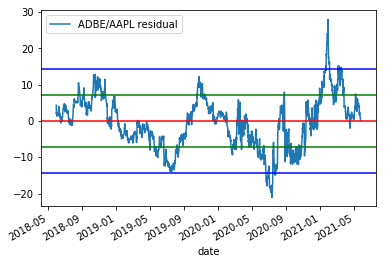

In [560]:
%matplotlib inline
df_result.plot(y="ADBE/AAPL residual")

plt.axhline(y=np.mean(df_result["ADBE/AAPL residual"]), color='r', linestyle='-')
plt.axhline(y=np.mean(df_result["ADBE/AAPL residual"]+res_result["ADBE/AAPL residual standard error"]), color='g', linestyle='-')
plt.axhline(y=np.mean(df_result["ADBE/AAPL residual"]-res_result["ADBE/AAPL residual standard error"]), color='g', linestyle='-')
plt.axhline(y=np.mean(df_result["ADBE/AAPL residual"]+2*res_result["ADBE/AAPL residual standard error"]), color='b', linestyle='-')
plt.axhline(y=np.mean(df_result["ADBE/AAPL residual"]-2*res_result["ADBE/AAPL residual standard error"]), color='b', linestyle='-')


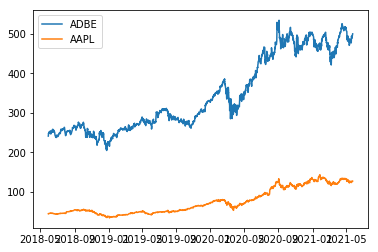

In [562]:
plt.plot(df_raw["ADBE"])
plt.plot(df_raw["AAPL"])
plt.legend(["ADBE", "AAPL"])

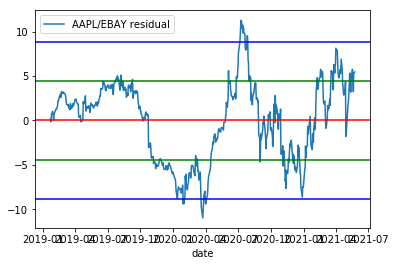

In [549]:
%matplotlib inline
df_result.plot(y="AAPL/EBAY residual")


plt.axhline(y=np.mean(df_result["AAPL/EBAY residual"]), color='r', linestyle='-')
plt.axhline(y=np.mean(df_result["AAPL/EBAY residual"]+res_result["AAPL/EBAY residual standard error"]), color='g', linestyle='-')
plt.axhline(y=np.mean(df_result["AAPL/EBAY residual"]-res_result["AAPL/EBAY residual standard error"]), color='g', linestyle='-')
plt.axhline(y=np.mean(df_result["AAPL/EBAY residual"]+2*res_result["AAPL/EBAY residual standard error"]), color='b', linestyle='-')
plt.axhline(y=np.mean(df_result["AAPL/EBAY residual"]-2*res_result["AAPL/EBAY residual standard error"]), color='b', linestyle='-')



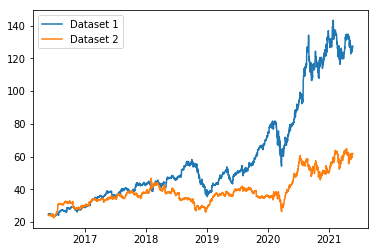

In [518]:
plt.plot(df_raw["AAPL"])
plt.plot(df_raw["EBAY"])
plt.legend(["Dataset 1", "Dataset 2",])

In [456]:
stats=df_raw.describe().transpose()
stats["Skew"]=df_raw.skew()
stats["Kurtosis"]=df_raw.kurt()
stats


,count,mean,std,min,25%,50%,75%,max,Skew,Kurtosis
AAPL,1762.0,50.636005,30.716804,22.285,28.67125,40.1225,55.31875,143.16,1.520770,1.219131
GOOGL,1762.0,1039.824906,400.345284,497.060,735.81500,1025.2700,1217.02000,2392.76,1.007162,0.955931
EBAY,1762.0,34.829078,10.199566,20.155,26.20250,34.1050,38.81000,64.93,0.926020,0.357533


In [92]:
for lag in range(5):
    lag+=1
    temp=[]
    for i in range(3):
        temp.append(df_raw.iloc[:,i].autocorr(lag=lag))
    stats["AC("+str(lag)+")"]=temp
stats


,count,mean,std,min,25%,50%,75%,max,Skew,Kurtosis,AC(1),AC(2),AC(3),AC(4),AC(5)
AAPL,64.0,126.487031,5.007936,116.40,122.0325,125.800,131.3150,134.85,0.228361,-1.129516,0.896993,0.833946,0.783626,0.770242,0.687946
GOOG,64.0,2199.642656,132.962856,2026.57,2059.6225,2246.695,2312.7175,2428.99,0.015042,-1.640368,0.964229,0.933262,0.909673,0.891215,0.853027
GOOGL,64.0,2178.625625,122.841922,2010.78,2048.1900,2224.615,2287.0100,2392.04,-0.051089,-1.675775,0.958010,0.924527,0.903557,0.886372,0.844117


In [80]:
import math
def sum_(x):
    x[-1]=x[-2]-x[-1]
    print(x)
    return sum(x)
df[""]df_raw["AAPL"].expanding().apply(sum_)

-23    1.570423
2021-03-24    1.566146
2021-03-25    1.567082
2021-03-26    1.568186
2021-03-29    1.568392
2021-03-30    1.565937
2021-03-31    1.569760
2021-04-01    1.571100
2021-04-05    1.575966
2021-04-06    1.576540
2021-04-07    1.579268
2021-04-08    1.583187
2021-04-09    1.587094
2021-04-12    1.584567
2021-04-13    1.589387
2021-04-14    1.585905
2021-04-15    1.589463
2021-04-16    1.588977
2021-04-19    1.590084
2021-04-20    1.587325
2021-04-21    1.588031
2021-04-22    1.585704
2021-04-23    1.589114
2021-04-26    1.589918
dtype: float64
date
2021-02-22    1.576163
2021-02-23    1.575735
2021-02-24    1.575027
2021-02-25    1.567739
2021-02-26    1.568238
2021-03-01    1.579026
2021-03-02    1.574845
2021-03-03    1.569573
2021-03-04    1.566268
2021-03-05    1.568392
2021-03-08    1.559624
2021-03-09    1.567842
2021-03-10    1.565972
2021-03-11    1.569317
2021-03-12    1.567842
2021-03-15    1.572749
2021-03-16    1.575505
2021-03-17    1.574149
2021-03-18    1.56699

date
2021-02-22     1.576163
2021-02-23     3.151898
2021-02-24     4.726925
2021-02-25     6.294663
2021-02-26     7.862901
                ...    
2021-05-14    93.034074
2021-05-17    94.610548
2021-05-18    96.184780
2021-05-19    97.758730
2021-05-20    99.336899
Name: AAPL, Length: 63, dtype: float64

In [114]:
ib.disconnect()